<a href="https://colab.research.google.com/github/Tech-Natra/notch_ml_project/blob/main/notebook/Prediction_Using_NLP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.mosaicplot import mosaic
from scipy.stats import chi2_contingency

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
"Stop words", len(stop_words)

('Stop words', 179)

###Strategies for Developing NLP Based Model
1. Data Extraction / Processing
2. Data Exploration
3. Define Business Objective: Building a classification model
4. Topic Modelling
5. Build Classification Model
6. Evaluate Performance of the Model

###Step 0: Data Pull

In [ ]:
# Download and unzip our zipfile
from urllib.request import urlopen
from zipfile import ZipFile

zipurl = 'https://github.com/Tech-Natra/notch_ml_project/raw/main/Data/kickstarter/kickstarter.csv.zip'
zipresp = urlopen(zipurl) # Create a new file on the hard drive
tempzip = open("/tmp/tempfile.zip", "wb") # Write the contents of the downloaded file into the new file
tempzip.write(zipresp.read()) # Close the newly-created file
tempzip.close() # Re-open the newly-created file with ZipFile()
zf = ZipFile("/tmp/tempfile.zip") # Extract its contents into <extraction_path>
zf.extractall(path = '') # note that extractall will automatically create the path, left blank so it's in working directory
# close the ZipFile instance
zf.close()

###Step1: Data Loading and Processing

In [ ]:
import csv
blurb = []
state = []
created_at = []
with open('/content/kickstarter.csv', newline='') as csvfile:
  kickstarter_reader = csv.reader(csvfile, delimiter=',', quotechar='"')
  for row in kickstarter_reader:
    blurb.append(row[0])
    state.append(row[1])
    created_at.append(row[2])

In [ ]:
kickstarter_data = pd.DataFrame(data = {"blurb": blurb, "state": state, "created_at": created_at})
kickstarter_data = kickstarter_data.drop([0])
kickstarter_data["state"] = kickstarter_data["state"].astype(int)

In [ ]:
kickstarter_data.head()

,blurb,state,created_at
1,Exploring paint and its place in a digital world.,0,2015-03-17
2,Mike Fassio wants a side-by-side photo of me a...,0,2014-07-11
3,I need your help to get a nice graphics tablet...,0,2014-07-30
4,I want to create a Nature Photograph Series of...,0,2015-05-08
5,I want to bring colour to the world in my own ...,0,2015-02-01


In [ ]:
kickstarter_data.state.value_counts()

0    141159
1    128631
Name: state, dtype: int64

In [ ]:
"Number of campaign", len(kickstarter_data)

('Number of campaign', 269790)

###Step 3: Text Data Exploration

In [ ]:
import string

kickstarter_data["campaign_text_length"] = kickstarter_data["blurb"].apply(lambda x: len(x))
kickstarter_data["campaign_word_length"] = kickstarter_data["blurb"].apply(lambda x: len(x.split(" ")))
kickstarter_data["num_blurb_punctuation"] = kickstarter_data["blurb"].apply(lambda x: sum([1 for w in x if w in string.punctuation.replace(".","")]))


In [ ]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [ ]:
kickstarter_data["lowercampaign_text"] = kickstarter_data["blurb"].apply(lambda x: x.lower().translate(str.maketrans('', '', string.punctuation)))

kickstarter_data["num_one_word_length"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if len(w) == 1]))
kickstarter_data["num_two_word_length"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if len(w) == 2]))
kickstarter_data["num_three_word_length"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if len(w) == 3]))

kickstarter_data["atmost_three_word_length"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if len(w) < 4]))

In [ ]:
kickstarter_data["num_stop_word"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if w in stop_words]))

<Axes: xlabel='campaign_text_length', ylabel='Density'>

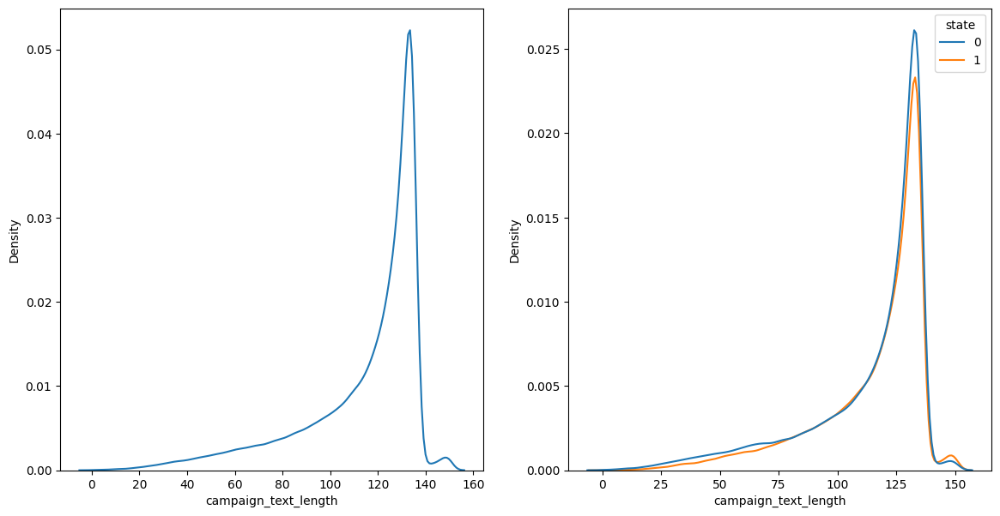

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data,
            x="campaign_text_length", ax = axs[0])
sns.kdeplot(data=kickstarter_data,
            x="campaign_text_length", hue= "state", ax = axs[1])

Text(0.5, 1.0, 'Successful Campaign Stop Word Distribution')

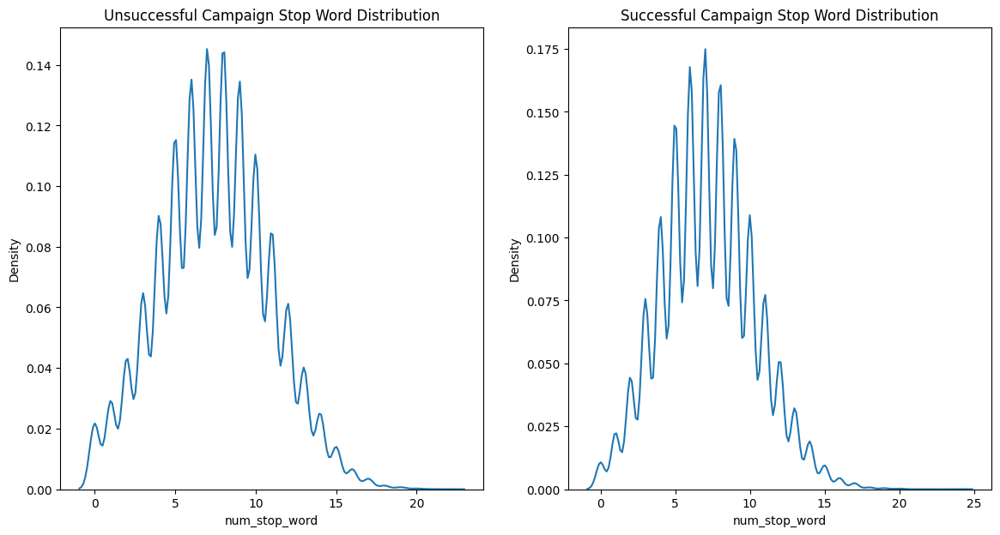

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 0], x="num_stop_word", ax = axs[0])
axs[0].set_title("Unsuccessful Campaign Stop Word Distribution")
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 1], x="num_stop_word", ax = axs[1])
axs[1].set_title("Successful Campaign Stop Word Distribution")

Text(0.5, 1.0, 'Successful Campaign Atmost 4 Words Distribution')

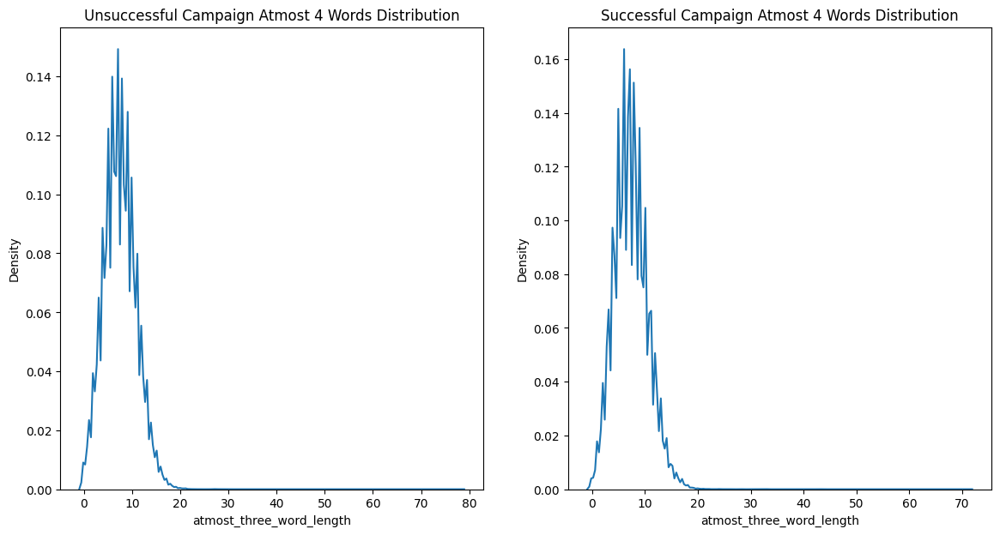

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 0],
            x="atmost_three_word_length", ax = axs[0])
axs[0].set_title("Unsuccessful Campaign Atmost 4 Words Distribution")
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 1],
            x="atmost_three_word_length", ax = axs[1])
axs[1].set_title("Successful Campaign Atmost 4 Words Distribution")

###Step 3: N-Gram Analysis

In [ ]:
def top_word_cnt(df,n,ngram_range=(1, 1), stop_word_list = list(stop_words)):
  cvectorizer = CountVectorizer(ngram_range=ngram_range, stop_words = stop_word_list)
  df_cnt = cvectorizer.fit_transform(df)
  vocab = cvectorizer.get_feature_names_out()
  m = np.array(df_cnt.sum(axis = 0)).flatten()
  if n<0:
    index = np.argsort(m)[n:]
  else:
    index = np.argsort(m)[:n]
  word_list = vocab[index]
  cnt_list = m[index]
  return pd.DataFrame(data = {"word": word_list, "cnt": cnt_list })

In [ ]:
most_freq_word_state_0 = top_word_cnt(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"], -11)
most_freq_word_state_1 = top_word_cnt(kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"], -11)

Text(0.5, 1.0, 'High Freq Words for Successful Campaign')

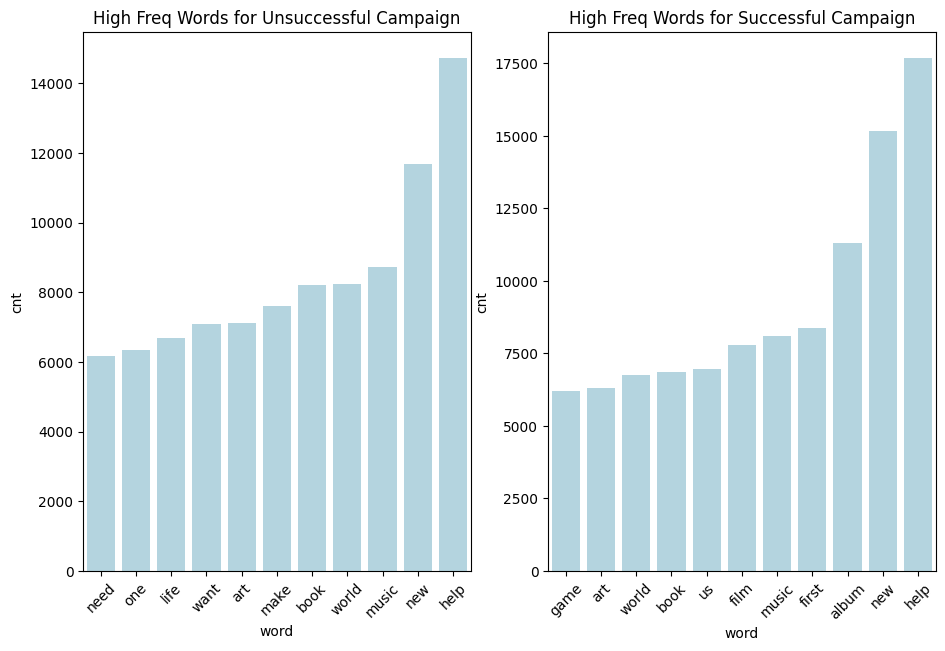

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(11,7))
sns.barplot(x = most_freq_word_state_0["word"],
            y = most_freq_word_state_0["cnt"],
            ax= axs[0], color= "lightblue")
axs[0].tick_params(axis='x', labelrotation=45)
axs[0].set_title("High Freq Words for Unsuccessful Campaign")

sns.barplot(x= most_freq_word_state_1["word"],
            y= most_freq_word_state_1["cnt"],
            ax= axs[1], color= "lightblue")
axs[1].tick_params(axis='x', labelrotation=45)
axs[1].set_title("High Freq Words for Successful Campaign")

In [ ]:
most_freq_word_state_0_bigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"], -11, (2, 2))
most_freq_word_state_1_bigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"], -11, (2, 2))

Text(0.5, 1.0, 'High Freq Bigram Words for Successful Campaign')

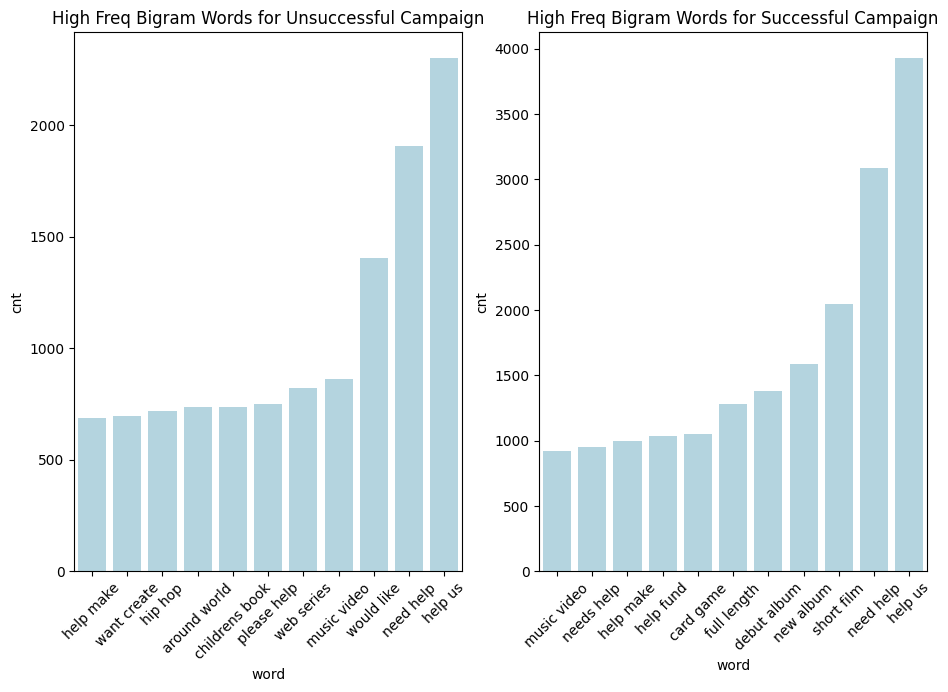

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(11,7))
sns.barplot(x = most_freq_word_state_0_bigram["word"],
            y = most_freq_word_state_0_bigram["cnt"],
            ax= axs[0], color= "lightblue")
axs[0].tick_params(axis='x', labelrotation=45)
axs[0].set_title("High Freq Bigram Words for Unsuccessful Campaign")

sns.barplot(x= most_freq_word_state_1_bigram["word"],
            y= most_freq_word_state_1_bigram["cnt"],
            ax= axs[1], color= "lightblue")
axs[1].tick_params(axis='x', labelrotation=45)
axs[1].set_title("High Freq Bigram Words for Successful Campaign")

In [ ]:
most_freq_word_state_0_trigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"], -11, (3, 3))
most_freq_word_state_1_trigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"], -11, (3, 3))

Text(0.5, 1.0, 'High Freq Bigram Words for Successful Campaign')

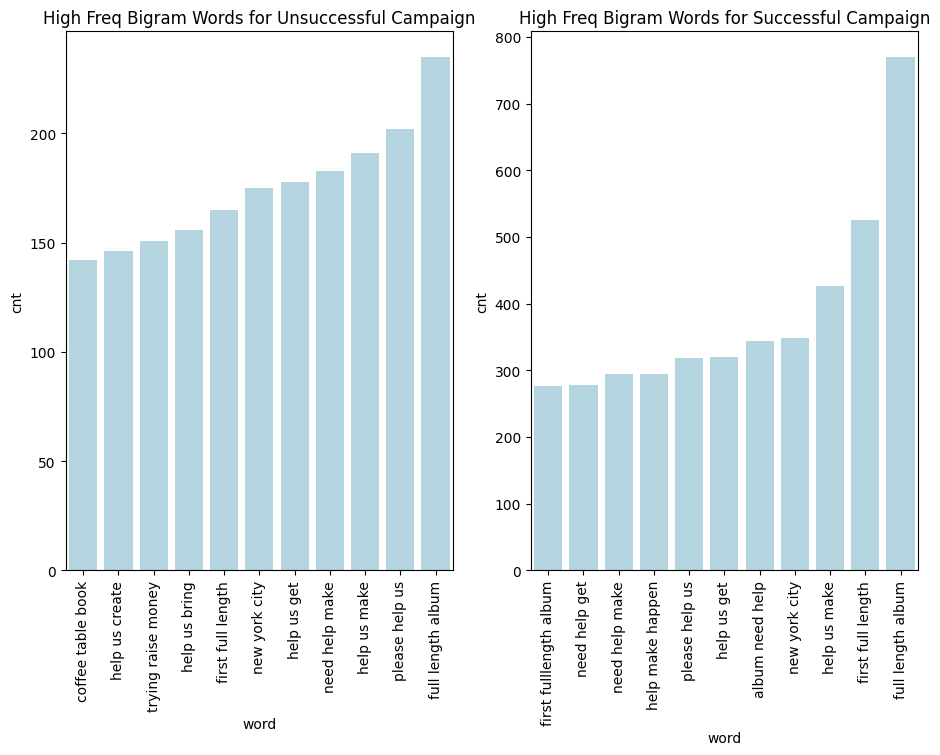

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(11,7))
sns.barplot(x = most_freq_word_state_0_trigram["word"],
            y = most_freq_word_state_0_trigram["cnt"],
            ax= axs[0], color= "lightblue")
axs[0].tick_params(axis='x', labelrotation=90)
axs[0].set_title("High Freq Bigram Words for Unsuccessful Campaign")

sns.barplot(x= most_freq_word_state_1_trigram["word"],
            y= most_freq_word_state_1_trigram["cnt"],
            ax= axs[1], color= "lightblue")
axs[1].tick_params(axis='x', labelrotation=90)
axs[1].set_title("High Freq Bigram Words for Successful Campaign")

###Step 4: Networkx Word Graph Analysis

In [ ]:
most_freq_word_state_0_bigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"], -100, (2, 2))
most_freq_word_state_1_bigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"], -100, (2, 2))

In [ ]:
most_freq_word_state_0_bigram[['word1', 'word2']] = most_freq_word_state_0_bigram['word'].str.split(" ", expand=True)

In [ ]:
most_freq_word_state_1_bigram[['word1', 'word2']] = most_freq_word_state_1_bigram['word'].str.split(" ", expand=True)

In [ ]:
most_freq_word_state_0_bigram.head()

,word,cnt,word1,word2
0,first time,186,first,time
1,record first,187,record,first
2,next generation,187,next,generation
3,music videos,189,music,videos
4,help funding,189,help,funding


In [ ]:
most_freq_word_state_1_bigram.head()

,word,cnt,word1,word2
0,release new,233,release,new
1,raspberry pi,233,raspberry,pi
2,open source,235,open,source
3,record debut,238,record,debut
4,release first,238,release,first


In [ ]:
import networkx as nx

In [ ]:
def make_graph(df):
  G = nx.Graph()
  for index_,pair in df[['word1', 'word2']].iterrows():
    G.add_node(pair["word1"])
    G.add_node(pair["word2"])
    G.add_edge(pair["word1"],pair["word2"])
  return G

def draw_graph(G, ax):
  pos  = nx.spring_layout(G, k =0.3, seed = 42)
  options = {
    "font_size": 9,
    "node_size": 7,
    "node_color": "white",
    "edgecolors": "black",
    "linewidths": 1,
    "width": 0.4
    }
  nx.draw(G, pos,with_labels= True, ax = ax, **options)

In [ ]:
G_state_0 = make_graph(most_freq_word_state_0_bigram[['word1', 'word2']])
G_state_1 = make_graph(most_freq_word_state_1_bigram[['word1', 'word2']])

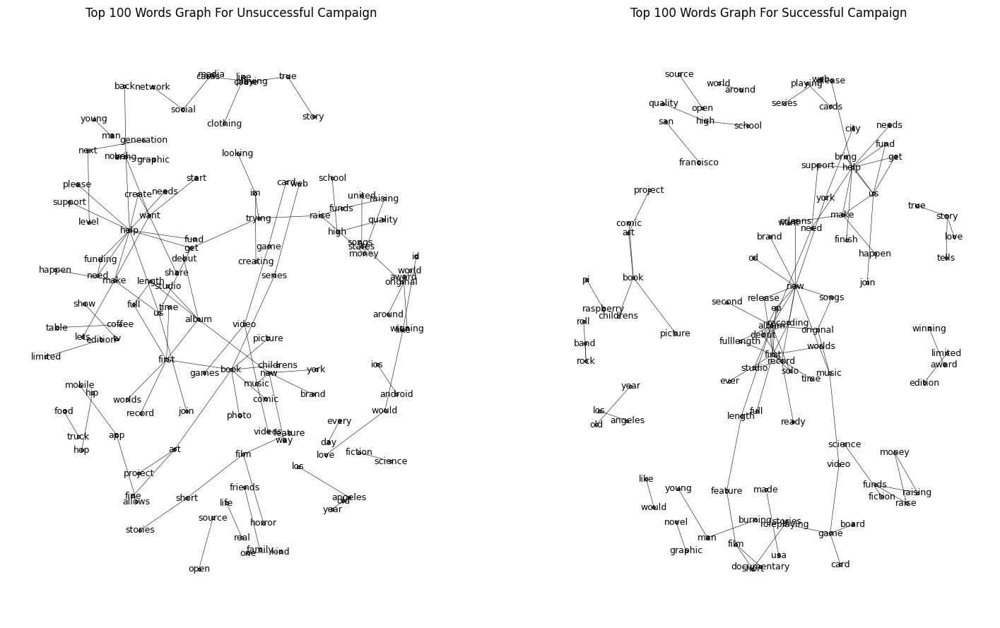

In [ ]:
fig, axs = plt.subplots(nrows = 1,ncols = 2, figsize=(18, 11))
draw_graph(G_state_0, axs[0])
axs[0].set_title("Top 100 Words Graph For Unsuccessful Campaign")
draw_graph(G_state_1, axs[1])
axs[1].set_title("Top 100 Words Graph For Successful Campaign")
plt.show()

###Step 5: Topic Modelling using BertTopic

In [ ]:
!pip install bertopic

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.4/143.4 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 17.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 9.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 11.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached Cython-0.29.36-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 35.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 7.1 MB/s eta 0:00:00
  Created wheel for hdbscan: filename=hdbscan-0.8.33-cp310-cp310-linux_x86_64.whl size=3039182 sha256=1bd496f7154eaed0a25bc7512621271cb0174728c2c8b463559b542b3ef13f69
  Stored in dir

In [ ]:
kickstarter_text = kickstarter_data["lowercampaign_text"]

In [ ]:
from nltk.tokenize import sent_tokenize, word_tokenize
sentences = [sent_tokenize(ktext) for ktext in kickstarter_text.sample(1000)]
sentences = [sentence for doc in sentences for sentence in doc]

In [ ]:
sentences[:5]

['lattepanda is featured with quadcore 18ghz 24g ram 3264 gb emmc wifi bluetooth 40 and usb 30 plus onboard arduino processor',
 'six spartanburgbased professional actors perform a midsummer nights dream outdoors in downtown spartanburg',
 'herricks new dance campaign we need you to make this happen',
 'who is amanda james follows amanda and her two best friends as they navigate life love sex and the city of dreamsla',
 'taking cosplay to a whole new level with lights sounds and robotics using engineering and all forms of armour construction']

####Step 5.1 Extract Embeddings

In [ ]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(sentences, show_progress_bar=True)

.gitattributes:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

data_config.json:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

train_script.py:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

Batches:   0%|          | 0/32 [00:00<?, ?it/s]

In [ ]:
embeddings.shape

(1000, 384)

####Step 5.2 Dimensionality Reduction

In [ ]:
from umap import UMAP

umap_model = UMAP(n_neighbors=15, n_components=5,
                  min_dist=0.0, metric='cosine', random_state=42)

####Step 5.3 Clustering

In [ ]:
from hdbscan import HDBSCAN

hdbscan_model = HDBSCAN(min_cluster_size=150, metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=True)

####Step 5.4 Extracting Word Importance

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_model = CountVectorizer(stop_words="english",
                                   min_df=2, ngram_range=(1, 2))

####Step 5.5 Fine-tune Word Representation

In [ ]:
from bertopic.representation import KeyBERTInspired
representation_model = KeyBERTInspired()

In [ ]:
from bertopic import BERTopic


In [ ]:
topic_model = BERTopic(

  # Pipeline models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  representation_model=representation_model,

  # Hyperparameters
  top_n_words=10,
  verbose=True
)

In [ ]:
topics, probs = topic_model.fit_transform(sentences, embeddings)

2023-11-21 02:45:24,039 - BERTopic - Reduced dimensionality
2023-11-21 02:45:24,099 - BERTopic - Clustered reduced embeddings


In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,533,-1_project_creating_games_create,"[project, creating, games, create, food, commu...",[basically this a new card game to have fun wi...
1,0,299,0_book_novel_books_adventures,"[book, novel, books, adventures, web series, j...","[selfpublishing my childrens book, what was on..."
2,1,168,1_new album_studio album_album help_album,"[new album, studio album, album help, album, n...",[im recording an album of music for guitar by ...


In [ ]:
topic_model.visualize_hierarchy(custom_labels=True)

In [ ]:
reduced_embeddings = UMAP(n_neighbors=10,
                          n_components=2, min_dist=0.0,
                          metric='cosine').fit_transform(embeddings)

In [ ]:
topic_model.visualize_documents(sentences,
                                reduced_embeddings=reduced_embeddings, custom_labels=True)

In [ ]:
!pip install fasttext

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.8/68.8 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Using cached pybind11-2.11.1-py3-none-any.whl (227 kB)
  Created wheel for fasttext: filename=fasttext-0.9.2-cp310-cp310-linux_x86_64.whl size=4199771 sha256=0e339e04849a69a3a644c0a507d2a126d41d2a3ebc0e37e8600fb88595c66eeb
  Stored in directory: /root/.cache/pip/wheels/a5/13/75/f811c84a8ab36eedbaef977a6a58a98990e8e0f1967f98f394
Successfully built fasttext


In [ ]:
import fasttext
!wget https://dl.fbaipublicfiles.com/fasttext/supervised-models/lid.176.ftz
model = fasttext.load_model('lid.176.ftz')
fast_text_model = fasttext.load_model('lid.176.ftz')

--2023-11-22 02:34:14--  https://dl.fbaipublicfiles.com/fasttext/supervised-models/lid.176.ftz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.108, 3.163.189.96, 3.163.189.14, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 938013 (916K) [binary/octet-stream]
Saving to: ‘lid.176.ftz’

lid.176.ftz         100%[===================>] 916.03K  --.-KB/s    in 0.05s   

2023-11-22 02:34:14 (18.2 MB/s) - ‘lid.176.ftz’ saved [938013/938013]



In [ ]:
from nltk.tokenize import sent_tokenize, word_tokenize
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.representation import KeyBERTInspired
from bertopic import BERTopic
import fasttext

class TopicGeneration:

  def __init__(self, textlist, detect_lang = False):
    self.textlist = textlist
    print("Sentence Conversion ....")
    sentences  = []

    if detect_lang:
      for ktext in textlist:
        try:
          if fast_text_model.predict(ktext, k=1)[0][0] == '__label__en':
            sentences.append(sent_tokenize(ktext))
        except:
          pass
    else:
      sentences = [sent_tokenize(ktext) for ktext in textlist]


    self.sentences = [sentence for doc in sentences for sentence in doc]
    print("Embedding Creation ....")
    self.embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
    self.embeddings = self.embedding_model.encode(self.sentences, show_progress_bar=False)
    self.reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(self.embeddings)
    print("Dimensionality Reduction ....")
    self.umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
    print("Cluster Creation ....")
    self.hdbscan_model = HDBSCAN(min_cluster_size=150, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
    print("Word Importance ....")
    self.vectorizer_model = CountVectorizer(stop_words="english", min_df=2, ngram_range=(1, 2))
    print("KeyBERTInspired Creation ....")
    self.representation_model = KeyBERTInspired()
    print("Enable Topic Bert Model ....")
    self.topic_model = BERTopic(
      # Pipeline models
      embedding_model=self.embedding_model,
      umap_model=self.umap_model,
      hdbscan_model=self.hdbscan_model,
      vectorizer_model=self.vectorizer_model,
      representation_model=self.representation_model,
      # Hyperparameters
      top_n_words=10,
      verbose=True
    )

  def info(self):
    return self.topic_model.get_topic_info()

  def train(self):
    self.topics, self.probs = self.topic_model.fit_transform(self.sentences, self.embeddings)

  def get_topic(self, topic_num):
    return self.topic_model.get_topic(0, full=True)

  def visualize_hierarchy(self):
    self.topic_model.visualize_hierarchy(custom_labels=True)

  def visualize_documents(self):
    self.topic_model.visualize_documents(self.sentences, reduced_embeddings=self.reduced_embeddings, custom_labels=True)


In [ ]:
kickstarter_text = kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"]

In [ ]:
topic_handler_state_0 = TopicGeneration(kickstarter_text.sample(50000), True)

Sentence Conversion ....
Embedding Creation ....


.gitattributes:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

data_config.json:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

train_script.py:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

Dimensionality Reduction ....
Cluster Creation ....
Word Importance ....
KeyBERTInspired Creation ....
Enable Topic Bert Model ....


In [ ]:
topic_handler_state_0.train()

2023-11-21 03:46:30,803 - BERTopic - Reduced dimensionality
2023-11-21 03:46:37,908 - BERTopic - Clustered reduced embeddings


In [ ]:
topic_handler_state_0.topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,18952,-1_book_novel_books_stories,"[book, novel, books, stories, story, children,...",[your life stories a chronicle of true storie...
1,0,8161,0_new album_album_debut album_recording,"[new album, album, debut album, recording, mus...",[real is recording a unique hip hop album feat...
2,1,4322,1_mobile app_mobile_app_apps,"[mobile app, mobile, app, apps, smartphone, an...",[spontaneous events with an app designed for y...
3,2,4285,2_food truck_catering_cuisine_restaurant,"[food truck, catering, cuisine, restaurant, fo...",[a food truck that brings the fun of the fair ...
4,3,1600,3_art gallery_public art_art project_artworks,"[art gallery, public art, art project, artwork...",[an art project to better a community by incre...
5,4,1340,4_mobile game_action game_mmorpg_video game,"[mobile game, action game, mmorpg, video game,...",[game for ios game in beatem up genre game ins...
6,5,1297,5_clothing brand_fashion brand_clothing line_f...,"[clothing brand, fashion brand, clothing line,...","[its every wear fashion, clothing line for hum..."
7,6,995,6_photography project_photography_photography ...,"[photography project, photography, photography...",[wanting to get into photography but want to p...
8,7,821,7_short film_film young_film_movie,"[short film, film young, film, movie, feature ...",[a short film centering around a killer for hi...
9,8,640,8_comedy series_comedy web_comedy webseries_co...,"[comedy series, comedy web, comedy webseries, ...",[an intergalactic comedy web series showcasing...


In [ ]:
topic_handler_state_0.topic_model.visualize_documents(topic_handler_state_0.sentences,
                                                      reduced_embeddings=topic_handler_state_0.reduced_embeddings,
                                                      custom_labels=True)

In [57]:
kickstarter_text = kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"]

In [58]:
topic_handler_state_1 = TopicGeneration(kickstarter_text.sample(50000), True)

Sentence Conversion ....
Embedding Creation ....
Dimensionality Reduction ....
Cluster Creation ....
Word Importance ....
KeyBERTInspired Creation ....
Enable Topic Bert Model ....


In [ ]:
topic_handler_state_1.train()

2023-11-21 04:23:18,350 - BERTopic - Reduced dimensionality
2023-11-21 04:23:25,572 - BERTopic - Clustered reduced embeddings


In [ ]:
topic_handler_state_1.topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,19200,-1_art_novel_artists_book,"[art, novel, artists, book, creative, rpg, cre...",[the return a documentary film by adam zucker ...
1,0,13759,0_album need_album_songs_cd,"[album need, album, songs, cd, recorded, recor...",[im recording a solo guitar record in april pl...
2,1,5020,1_short film_film_films_filmmakers,"[short film, film, films, filmmakers, feature ...","[my first truly cinematic short film, ten minu..."
3,2,2013,2_restaurant_cafe_food truck_foods,"[restaurant, cafe, food truck, foods, kitchen,...",[delicious organic south american street food...
4,3,1401,3_card game_cards_board game_strategy game,"[card game, cards, board game, strategy game, ...",[a mahjong variant rummystyle card game for o...
5,4,1231,4_iphone ipad_iphone_smartphones_charging,"[iphone ipad, iphone, smartphones, charging, d...",[enhance your iphone camera with the izzi orbi...
6,5,865,5_children book_childrens book_childrens books...,"[children book, childrens book, childrens book...",[theodore the thoughtful is an illustrated chi...
7,6,845,6_art gallery_art exhibition_paintings_gallery,"[art gallery, art exhibition, paintings, galle...",[most wanted fine art gallery goes on a southe...
8,7,750,7_apparel_clothing_garments_fashion,"[apparel, clothing, garments, fashion, clothes...","[london inspired clothing with a heart, wearab..."
9,8,469,8_collection poetry_collection poems_book poet...,"[collection poetry, collection poems, book poe...",[celebrate national poetry month by helping us...


In [ ]:
topic_handler_state_1.topic_model.visualize_documents(topic_handler_state_1.sentences, reduced_embeddings=topic_handler_state_1.reduced_embeddings, custom_labels=True)

###Step 6: Logisitic Regression Model using TFIDF

In [ ]:
import csv
blurb = []
state = []
created_at = []
with open('/content/kickstarter.csv', newline='') as csvfile:
  kickstarter_reader = csv.reader(csvfile, delimiter=',', quotechar='"')
  for row in kickstarter_reader:
    blurb.append(row[0])
    state.append(row[1])
    created_at.append(row[2])
kickstarter_data = pd.DataFrame(data = {"blurb": blurb, "state": state, "created_at": created_at})
kickstarter_data = kickstarter_data.drop([0])
kickstarter_data["state"] = kickstarter_data["state"].astype(int)

In [ ]:
kickstarter_data.head()

,blurb,state,created_at
1,Exploring paint and its place in a digital world.,0,2015-03-17
2,Mike Fassio wants a side-by-side photo of me a...,0,2014-07-11
3,I need your help to get a nice graphics tablet...,0,2014-07-30
4,I want to create a Nature Photograph Series of...,0,2015-05-08
5,I want to bring colour to the world in my own ...,0,2015-02-01


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(kickstarter_data.blurb)

In [ ]:
X_train_counts.shape

(269790, 87709)

In [ ]:
from sklearn.feature_extraction.text import TfidfTransformer
tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)

In [ ]:
X_train_tfidf.shape

(269790, 87709)

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X_train_tfidf,
    kickstarter_data["state"],
    random_state=2023,
    test_size=0.1
)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

In [ ]:
logreg_parameters = {
  'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], # Lets try bigger combination
  'classifier__penalty': ["l1","l2"]
}

In [ ]:
text_clf = Pipeline([
    ('classifier', LogisticRegression(random_state=2023)),
])


In [ ]:
grid = GridSearchCV(text_clf, logreg_parameters, cv=10).fit(X_train, y_train)

In [ ]:
best_params_ = grid.best_params_
best_classifer_ = grid.best_estimator_
print(f"Best Classifier {best_params_}")

Best Classifier {'classifier__C': 10, 'classifier__penalty': 'l2'}


In [ ]:
best_classifer_.fit(X_train, y_train)

Pipeline(steps=[('classifier', LogisticRegression(C=10, random_state=2023))])

In [ ]:
best_classifer_.score(X_test, y_test)

0.7255643278105193

In [ ]:
from sklearn import metrics
def auc_metric(classifer, X_test_feature_set, y_test):
  y_pred_proba = classifer.predict_proba(X_test_feature_set)[::,1]
  auc = metrics.roc_auc_score(y_test, y_pred_proba)
  return auc

In [ ]:
auc_metric(best_classifer_, X_test, y_test)

0.7989986761098322

In [ ]:
from sklearn import metrics
def plot_roc_curve(classifer, X_test_feature_set, y_test, name = ""):
  y_pred_proba = classifer.predict_proba(X_test_feature_set)[::,1]
  fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)
  auc = metrics.roc_auc_score(y_test, y_pred_proba)
  plt.plot(fpr,tpr,label="data 1, auc="+str(round(auc, 2)))
  plt.legend(loc=4)
  plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
  plt.xlim([0.0, 1.0])
  plt.ylim([0.0, 1.05])
  plt.xlabel("False Positive Rate")
  plt.ylabel("True Positive Rate")
  plt.title(f"Receiver operating characteristic {name}")
  plt.legend(loc="lower right")
  plt.show()

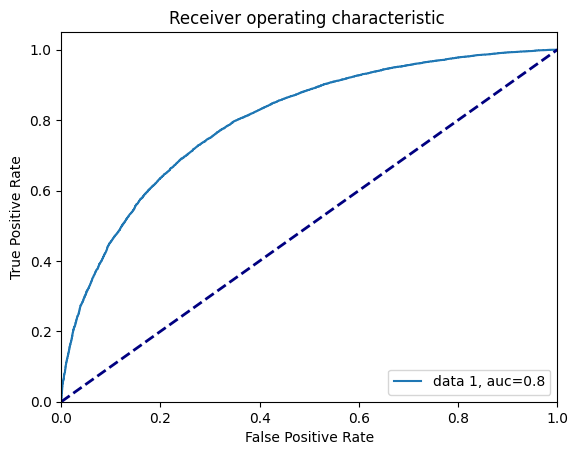

In [ ]:
plot_roc_curve(best_classifer_, X_test, y_test)

In [ ]:
index_v = count_vect.vocabulary_.get(u'music')
music_tfidf = X_train_tfidf[:, index_v].toarray().flatten()
music_tfidf_df = pd.DataFrame(data = {"tfidf": music_tfidf,
                                      "state": kickstarter_data["state"],
                                      "probability": best_classifer_.predict_proba(X_train_tfidf)[:, 1]})

In [ ]:
music_tfidf_df[music_tfidf_df.tfidf > 0].head()

,tfidf,state,probability
88,0.140749,0,0.386533
100,0.188551,0,0.464263
333,0.117021,0,0.048470
344,0.131079,0,0.342296
360,0.148134,0,0.142517


Text(0.5, 1.0, "TFIDF Plot for word 'music'")

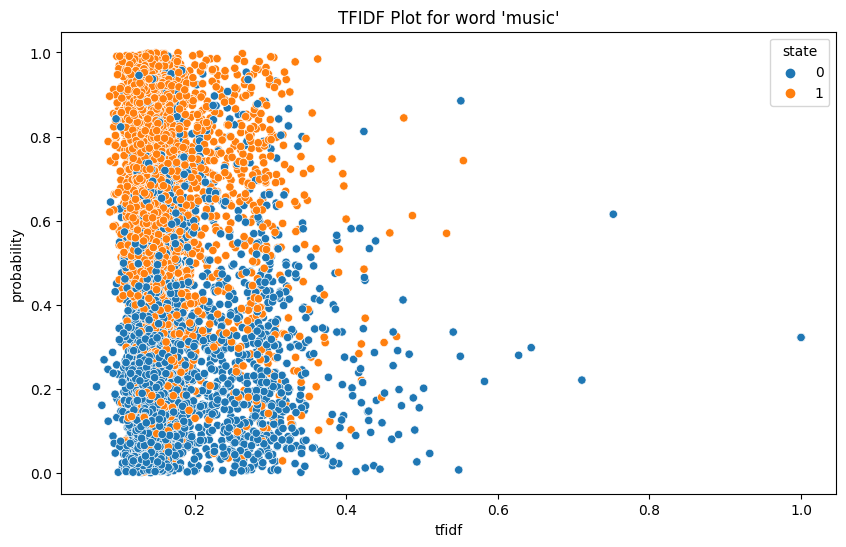

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(data = music_tfidf_df[music_tfidf_df.tfidf > 0],
                x = "tfidf",
                y = "probability",
                hue = "state")
plt.title(f"TFIDF Plot for word 'music'")

In [ ]:
def get_tfidf_dataframe(word):
  index_v = count_vect.vocabulary_.get(word)
  _tfidf = X_train_tfidf[:, index_v].toarray().flatten()
  _tfidf_df = pd.DataFrame(data = {"tfidf":  _tfidf, "state": kickstarter_data["state"], "probability": best_classifer_.predict_proba(X_train_tfidf)[:, 1]})
  return _tfidf_df

In [ ]:
help_tfidf_df = get_tfidf_dataframe(u'help')

<Axes: xlabel='tfidf', ylabel='probability'>

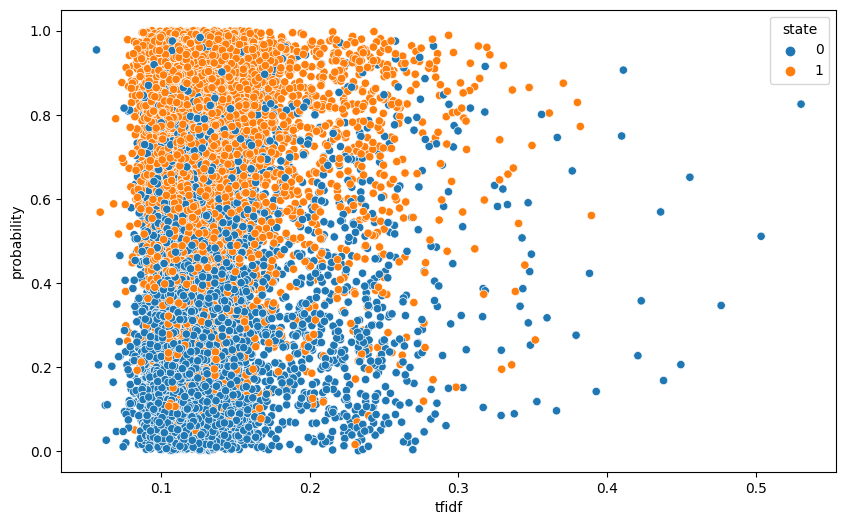

In [ ]:
plt.figure(figsize=(10,6))
sns.scatterplot(data = help_tfidf_df[help_tfidf_df.tfidf > 0],
                x = "tfidf",
                y = "probability",
                hue = "state")

###Step 7: Logistic Regression using Embeddings

In [78]:
from sentence_transformers import SentenceTransformer
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

In [ ]:
kickstarter_text = kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"]
state_0_embedding =  embedding_model.encode(kickstarter_text.sample(50000).values,
                                     show_progress_bar=True)

In [ ]:
kickstarter_text = kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"]
state_1_embedding =  embedding_model.encode(kickstarter_text.sample(50000).values,
                                     show_progress_bar=True)

In [79]:
state_0_embedding.shape

(50000, 384)

In [80]:
state_0_embedding = pd.DataFrame(state_0_embedding )
state_1_embedding = pd.DataFrame(state_1_embedding )

In [81]:
state_0_embedding["state"] = 0
state_1_embedding["state"] = 1

In [82]:
kickstart_data_use = pd.concat([state_0_embedding, state_1_embedding],
                               axis=0)

In [83]:
# Shuffle Data
kickstart_data_use = kickstart_data_use.sample(frac = 1)

In [84]:
kickstart_data_use.head()

,0,1,2,3,4,5,6,7,8,9,...,375,376,377,378,379,380,381,382,383,state
35001,-0.040578,0.027723,0.010541,-0.039784,-0.066636,0.088095,0.081097,-0.007561,-0.043557,0.061353,...,0.028179,-0.039271,0.072776,-0.048637,-0.028599,0.089650,0.016120,-0.084472,-0.063742,1
12692,0.008032,-0.009848,-0.007966,0.052491,0.033972,0.103027,-0.016960,-0.064495,-0.052457,-0.021172,...,0.039178,-0.049276,0.079766,-0.037189,0.058287,0.030324,-0.057055,-0.006149,0.004962,0
47549,-0.038402,-0.109536,-0.039112,-0.067522,0.027640,0.011165,-0.015388,-0.084359,0.056485,-0.080060,...,-0.036219,-0.063088,0.090869,-0.021499,-0.021786,0.014967,0.040772,0.051650,0.025290,0
4041,-0.088966,0.000464,-0.068491,0.044095,-0.061487,-0.025251,0.061587,-0.003392,-0.071080,-0.071333,...,0.036903,-0.081269,0.086004,0.000545,0.048964,0.040048,0.038223,-0.042422,0.026360,1
10595,-0.046007,-0.047973,-0.064176,-0.048435,-0.048388,0.013009,0.122975,-0.037464,-0.045800,-0.064619,...,-0.107097,-0.029346,0.098871,-0.040311,-0.020271,0.034284,-0.018412,0.009911,0.008752,0


In [85]:
from sklearn.model_selection import train_test_split

In [86]:
X_train, X_test, y_train, y_test = train_test_split(
    kickstart_data_use.drop(columns="state"),
    kickstart_data_use["state"],
    random_state=2023,
    test_size=0.1
)

In [87]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

In [88]:
logreg_parameters = {
  'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], # Lets try bigger combination
  'classifier__penalty': ["l1","l2"]
}

In [89]:
pipe_logreg = Pipeline([
    ('classifier', LogisticRegression(random_state=2023))
])

In [90]:
grid = GridSearchCV(pipe_logreg, logreg_parameters,
                    cv=10).fit(X_train, y_train)

In [95]:
best_params_ = grid.best_params_
best_classifer_ = grid.best_estimator_
print(f"Best Classifier {best_params_}")

Best Classifier {'classifier__C': 10, 'classifier__penalty': 'l2'}


In [96]:
best_classifer_.fit(X_train, y_train)

Pipeline(steps=[('classifier', LogisticRegression(C=10, random_state=2023))])

In [97]:
best_classifer_.score(X_test, y_test)

0.6664

In [98]:
from sklearn import metrics
def auc_metric(classifer, X_test_feature_set, y_test):
  y_pred_proba = classifer.predict_proba(X_test_feature_set)[::,1]
  auc = metrics.roc_auc_score(y_test, y_pred_proba)
  return auc

auc_metric(best_classifer_, X_test, y_test)

0.7262982025693951

###Step 9: Bert Transformer Model for Classification

In [ ]:
%pip install torch
%pip install transformers
%pip install transformers[torch]
%pip install datasets
%pip install bertviz

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
from datasets import Dataset
from datasets.features.features import ClassLabel

In [5]:
import torch
from transformers import AutoTokenizer, AutoConfig, AutoModelForSequenceClassification, DataCollatorWithPadding
from transformers import Trainer, TrainingArguments
import datasets
from datasets import DatasetDict
from transformers import pipeline
from typing import List
import pandas as pd
import numpy as np
from torch.nn.functional import cross_entropy

In [6]:
# Download and unzip our zipfile
from urllib.request import urlopen
from zipfile import ZipFile

zipurl = 'https://github.com/Tech-Natra/notch_ml_project/raw/main/Data/kickstarter/kickstarter.csv.zip'
zipresp = urlopen(zipurl) # Create a new file on the hard drive
tempzip = open("/tmp/tempfile.zip", "wb") # Write the contents of the downloaded file into the new file
tempzip.write(zipresp.read()) # Close the newly-created file
tempzip.close() # Re-open the newly-created file with ZipFile()
zf = ZipFile("/tmp/tempfile.zip") # Extract its contents into <extraction_path>
zf.extractall(path = '') # note that extractall will automatically create the path, left blank so it's in working directory
# close the ZipFile instance
zf.close()

In [7]:
import csv
blurb = []
state = []
created_at = []
with open('/content/kickstarter.csv', newline='') as csvfile:
  kickstarter_reader = csv.reader(csvfile, delimiter=',', quotechar='"')
  for row in kickstarter_reader:
    blurb.append(row[0])
    state.append(row[1])
    created_at.append(row[2])
kickstarter_data = pd.DataFrame(data = {"blurb": blurb, "state": state, "created_at": created_at})
kickstarter_data = kickstarter_data.drop([0])
kickstarter_data["state"] = kickstarter_data["state"].astype(int)

In [8]:
kickstarter_data = kickstarter_data[kickstarter_data["blurb"].apply(lambda x : len(x) > 20)]

In [9]:
len(kickstarter_data)

269036

In [10]:
_ds = Dataset.from_dict(
            dict(
            text=kickstarter_data["blurb"],
            label=kickstarter_data["state"]
            )
        )

In [11]:
kickstarter_ds = _ds.train_test_split(test_size=0.1)

In [12]:
kickstarter_ds

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 242132
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 26904
    })
})

In [13]:
model_name = "roberta-base"
model_ckpt = from_pretrained_str = "roberta-base"
max_len = 160
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 64
num_train_epochs = 2
num_labels = 2
features = ['text', 'label']
input_ = features[0] # expect text
label_ = features[1] # expect label

In [14]:
output_dir = f"{model_ckpt}-finetuned-classifier"

In [15]:
_tokenizer = AutoTokenizer.from_pretrained(from_pretrained_str, max_len = max_len)

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [16]:
_model =  AutoModelForSequenceClassification.from_pretrained(model_ckpt, num_labels = num_labels).to(device)

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.out_proj.bias', 'classifier.out_proj.weight', 'classifier.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [17]:
training_args = TrainingArguments(output_dir=output_dir,
                                  overwrite_output_dir=True,
                                  num_train_epochs=num_train_epochs,
                                  load_best_model_at_end = True,
                                  learning_rate=2e-5,
                                  per_device_train_batch_size=batch_size,
                                  per_device_eval_batch_size=batch_size,
                                  weight_decay=0.01,
                                  evaluation_strategy="epoch",
                                  save_strategy = 'epoch',
                                  eval_steps = 50,
                                  disable_tqdm=False,
                                  push_to_hub=False,
                                  log_level="info")

In [18]:
def _tokenize(batch):
  return _tokenizer(batch[input_], padding=True, truncation=True)
kickstarter_ds_encoded = kickstarter_ds.map(_tokenize, batched = True)

Map:   0%|          | 0/242132 [00:00<?, ? examples/s]

Map:   0%|          | 0/26904 [00:00<?, ? examples/s]

In [19]:
kickstarter_ds_encoded

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 242132
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 26904
    })
})

In [20]:
kickstarter_ds_encoded.set_format("torch",
                      columns=["input_ids", "attention_mask", label_])

In [22]:
kickstarter_ds_encoded


DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 242132
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 26904
    })
})

In [23]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    f1 = f1_score(labels, preds, average="weighted")
    acc = accuracy_score(labels, preds)
    prec = precision_score(labels, preds, average="weighted")
    recall = recall_score(labels, preds, average="weighted")

    return {"accuracy": acc, "f1": f1, "prec": prec, "recall": recall}

In [24]:
trainer = Trainer(model=_model,
                  args=training_args,
                  data_collator=DataCollatorWithPadding(_tokenizer),
                  compute_metrics=compute_metrics,
                  train_dataset=kickstarter_ds_encoded["train"],
                  eval_dataset=kickstarter_ds_encoded["validation"] if "validation" in kickstarter_ds_encoded else kickstarter_ds_encoded["test"],
                  tokenizer=_tokenizer
)

In [25]:
trainer.train()

The following columns in the training set don't have a corresponding argument in `RobertaForSequenceClassification.forward` and have been ignored: text. If text are not expected by `RobertaForSequenceClassification.forward`,  you can safely ignore this message.
***** Running training *****
  Num examples = 242,132
  Num Epochs = 2
  Instantaneous batch size per device = 64
  Total train batch size (w. parallel, distributed & accumulation) = 64
  Gradient Accumulation steps = 1
  Total optimization steps = 7,568
  Number of trainable parameters = 124,647,170
You're using a RobertaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Epoch,Training Loss,Validation Loss,Accuracy,F1,Prec,Recall
1,0.519500,0.493280,0.753159,0.753314,0.754791,0.753159


The following columns in the evaluation set don't have a corresponding argument in `RobertaForSequenceClassification.forward` and have been ignored: text. If text are not expected by `RobertaForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Evaluation *****
  Num examples = 26904
  Batch size = 64
Saving model checkpoint to roberta-base-finetuned-classifier/checkpoint-3784
Configuration saved in roberta-base-finetuned-classifier/checkpoint-3784/config.json
Model weights saved in roberta-base-finetuned-classifier/checkpoint-3784/pytorch_model.bin
tokenizer config file saved in roberta-base-finetuned-classifier/checkpoint-3784/tokenizer_config.json
Special tokens file saved in roberta-base-finetuned-classifier/checkpoint-3784/special_tokens_map.json


Epoch,Training Loss,Validation Loss,Accuracy,F1,Prec,Recall
1,0.519500,0.493280,0.753159,0.753314,0.754791,0.753159
2,0.437200,0.469816,0.772264,0.771570,0.782484,0.772264


The following columns in the evaluation set don't have a corresponding argument in `RobertaForSequenceClassification.forward` and have been ignored: text. If text are not expected by `RobertaForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Evaluation *****
  Num examples = 26904
  Batch size = 64
Saving model checkpoint to roberta-base-finetuned-classifier/checkpoint-7568
Configuration saved in roberta-base-finetuned-classifier/checkpoint-7568/config.json
Model weights saved in roberta-base-finetuned-classifier/checkpoint-7568/pytorch_model.bin
tokenizer config file saved in roberta-base-finetuned-classifier/checkpoint-7568/tokenizer_config.json
Special tokens file saved in roberta-base-finetuned-classifier/checkpoint-7568/special_tokens_map.json


Training completed. Do not forget to share your model on huggingface.co/models =)


Loading best model from roberta-base-finetuned-classifier/checkpoint-7568 (score: 0.4698161482810974).


TrainOutput(global_step=7568, training_loss=0.49672307827003914, metrics={'train_runtime': 9932.941, 'train_samples_per_second': 48.753, 'train_steps_per_second': 0.762, 'total_flos': 3.356686772078472e+16, 'train_loss': 0.49672307827003914, 'epoch': 2.0})